# Change directory to project root

In [5]:
import os


if "original_dir" in globals():
    # current_dir = os.path.dirname(original_dir)
    current_dir = original_dir
    os.chdir(current_dir)
    print(f"Current directory: {current_dir}")
else:
    original_dir = os.getcwd()
    print(f"Current directory: {original_dir}")

os.chdir("../../../../")
print(f"Changed directory: {os.getcwd()}")

Current directory: d:\northeastern\neu_dev\myo_assist_dev\myosuite\rl_train\myoassist\analyzer
Changed directory: d:\northeastern\neu_dev\myo_assist_dev


# Test gait_evaluate.py

In [ ]:
import os
from myoassist_rl.rl_train.utils.handlers.train_log_handler import TrainLogHandler
log_folder_name = input("folder_name")
if log_folder_name == "":
    log_folder_name = "train_session_for_test"
log_dir = os.path.join("train_logs","selected",log_folder_name)
analyze_result_dir = os.path.join(log_dir,"analyze_results")
if not os.path.exists(analyze_result_dir):
    os.makedirs(analyze_result_dir)

log_handler = TrainLogHandler(log_dir,"session_name")
log_handler.load_log_data(TrainLogHandler.TrainCheckpointData)


TypeError: TrainLogHandler.TrainCheckpointData.__init__() got an unexpected keyword argument 'reward_accumulate'

: 

In [3]:
log_handler.log_datas[-1].to_dict()

{'approx_kl': 0.015163913369178772,
 'clip_fraction': 0.1895288927801724,
 'clip_range': 0.2,
 'clip_range_vf': 100.0,
 'entropy_loss': -6.324315186204581,
 'explained_variance': 0.9953374266624451,
 'learning_rate': 0.0002,
 'loss': -0.04351344332098961,
 'n_updates': 24859,
 'policy_gradient_loss': -0.023570836888995535,
 'std': 0.3429009020328522,
 'value_loss': 1.11755311520718e-05,
 'num_timesteps': 10002432,
 'average_num_timestep': 500.0,
 'average_reward_per_episode': 18.856716525319673,
 'time': '20250220-134249.259609'}

# Plot traing logs

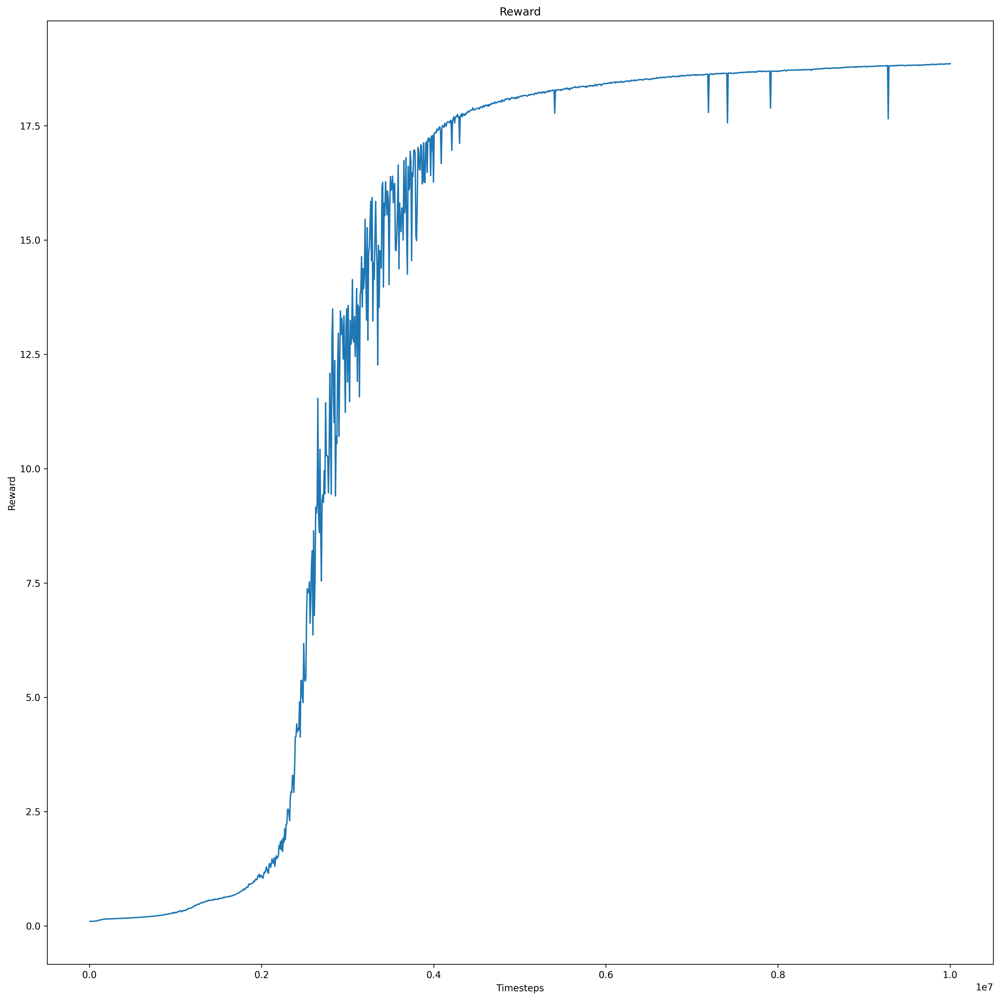

In [4]:
import sys
sys.modules.pop('package.train_log_analyzer', None)
from package.train_log_analyzer import TrainLogAnalyzer
train_log_analyzer = TrainLogAnalyzer(log_handler)
train_log_analyzer.plot_reward(result_dir=analyze_result_dir)


In [5]:
# train_log_analyzer.plot_reward_weights(result_dir=analyze_result_dir)


## Load session config


In [6]:
import json
from package.config import TrainSessionConfigBase
with open(os.path.join(log_dir, "session_config.json"), 'r') as f:
    config_dict = json.load(f)
config = TrainSessionConfigBase(**config_dict)


In [7]:
gait_data_name = f"{log_handler.session_name}_gait_evaluated_data.json"
if os.path.exists(os.path.join(analyze_result_dir, gait_data_name)):
    user_input = input(f"Regenerate evaluate data? ({gait_data_name}) (y/n(anything))")
else:
    user_input = "y"
is_regen_evaluating_data = True if user_input == "y" else False

from package.gait_evaluate import GaitEvaluatorBase
gait_evaluator = GaitEvaluatorBase(log_handler, config)
# gait_evaluator.load_reference_data()
gait_evaluator.initialize_env()
if is_regen_evaluating_data:
    gait_data_path = gait_evaluator.evaluate(result_dir=analyze_result_dir,
                                            file_name=gait_data_name)
else:
    gait_data_path = os.path.join(analyze_result_dir, gait_data_name)
    

pygame 2.6.1 (SDL 2.28.4, Python 3.10.11)
Hello from the pygame community. https://www.pygame.org/contribute.html


d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\gymnasium\envs\registration.py:596: UserWarning: WARN: plugin: shimmy.registration:register_gymnasium_envs raised Traceback (most recent call last):
  File "d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\gymnasium\envs\registration.py", line 594, in load_plugin_envs
    fn()
  File "d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\shimmy\registration.py", line 303, in register_gymnasium_envs
    _register_dm_control_envs()
  File "d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\shimmy\registration.py", line 63, in _register_dm_control_envs
    from shimmy.dm_control_compatibility import DmControlCompatibilityV0
  File "d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\shimmy\dm_control_compatibility.py", line 20, in <module>
    from gymnasium.envs.mujoco.mujoco_rendering import MujocoRenderer
  File "d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-

MyoSuite:> Registering Myo Envs
=================environment seed: 1234=====================
=================environment model_path: neumove_models/gait14dof22musc_cvt3_Right_Toeless_2D.xml=====================
    NeuMove MyoLeg18
    


# Test gait_analyze.py - GaitAnalyzer

In [8]:
import sys
sys.modules.pop('package.gait_analyze', None)
sys.modules.pop('package.gait_evaluate', None)
from package.gait_analyze import GaitAnalyzer
from package.gait_evaluate import GaitData


gait_data = GaitData()
gait_data.read_json_data(gait_data_path)
import json 
with open(os.path.join("neumove_models/reference_data_segmented/02-constspeed_reduced_humanoid_segmented.json"), 'r') as f:
    segmented_ref_data = json.load(f)
gait_analyzer = GaitAnalyzer(gait_data, segmented_ref_data)

self.gait_data.series_data.keys()=dict_keys(['joint_data', 'actuator_data', 'sensor_data', 'physics_data'])


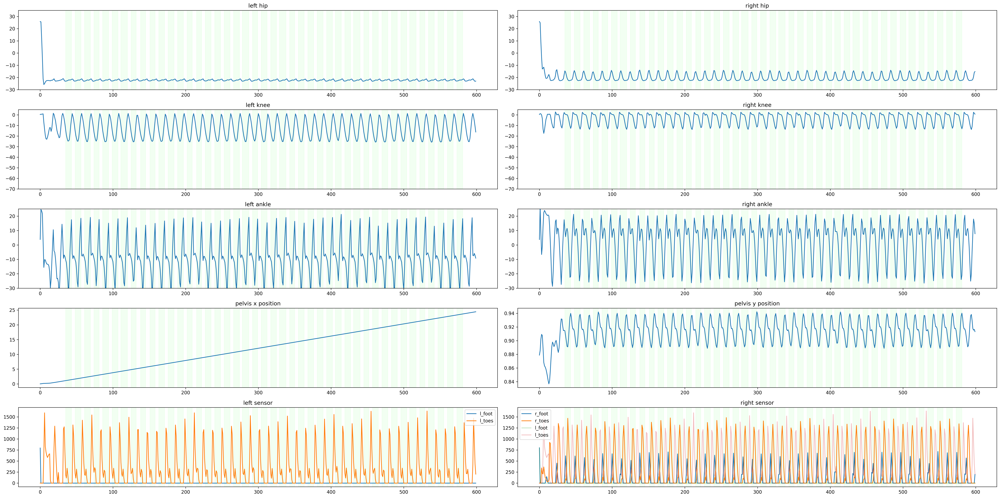

In [9]:
gait_analyzer.plot_entire_result(result_dir=analyze_result_dir,is_right_foot_based=True)

self.gait_data.series_data.keys()=dict_keys(['joint_data', 'actuator_data', 'sensor_data', 'physics_data'])


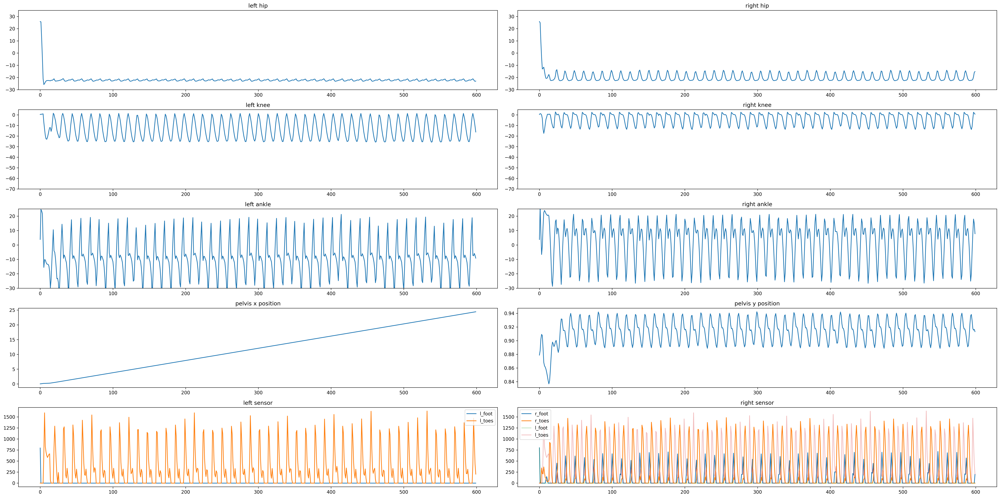

In [10]:
gait_analyzer.plot_entire_result(result_dir=analyze_result_dir,is_right_foot_based=False)

D:\northeastern\neu_dev\myosuite_project\src\package\gait_analyze.py:227: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


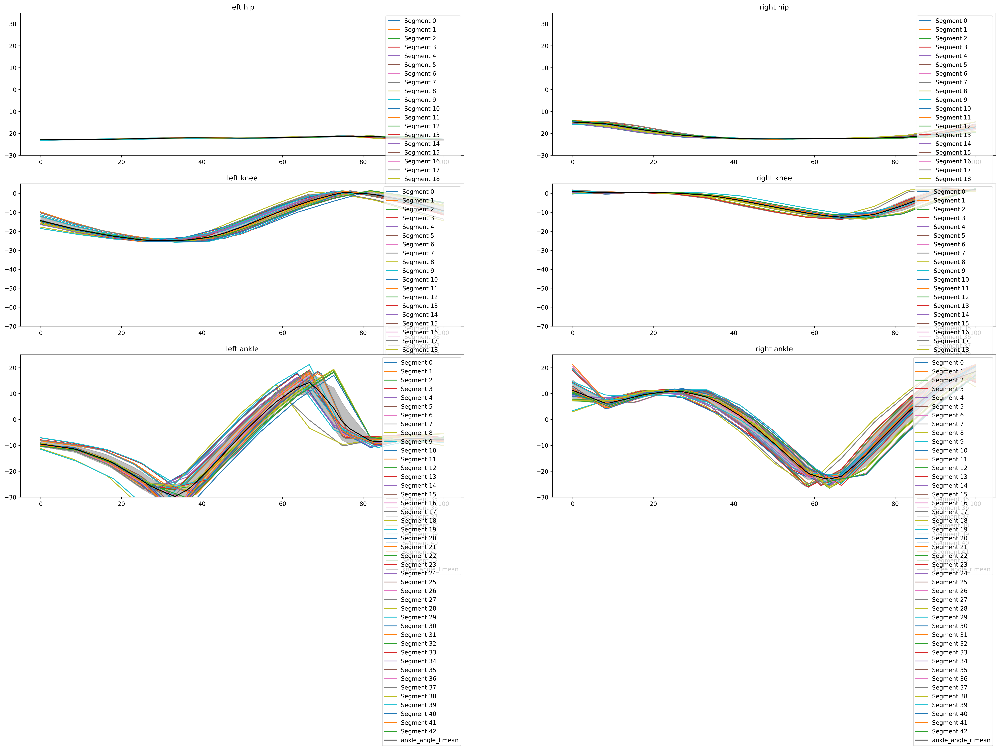

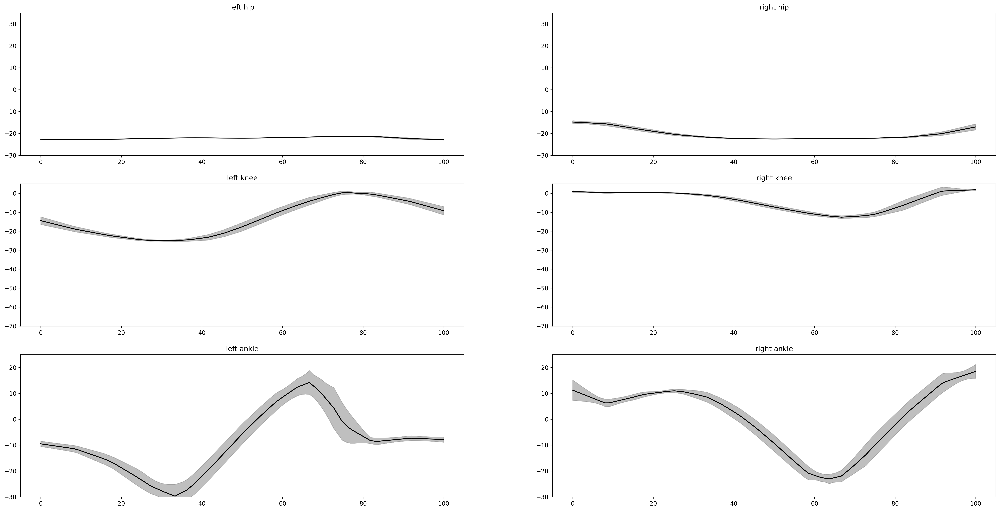

In [11]:
gait_analyzer.plot_segmented_result(result_dir=analyze_result_dir)

D:\northeastern\neu_dev\myosuite_project\src\package\gait_analyze.py:341: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
D:\northeastern\neu_dev\myosuite_project\src\package\gait_analyze.py:343: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


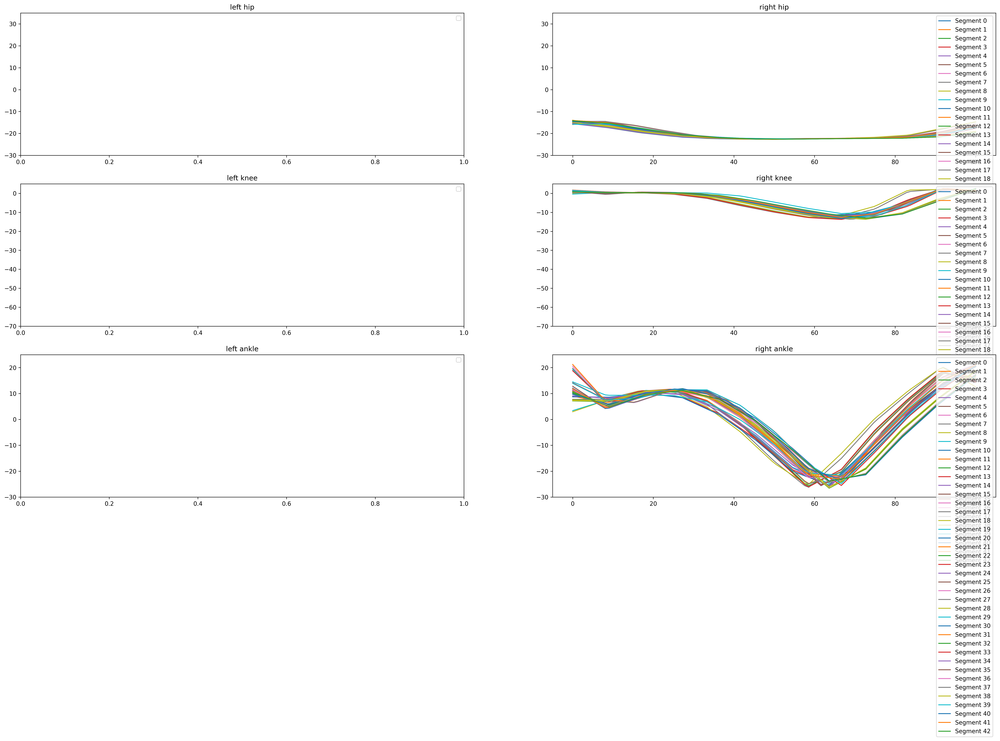

DEBUG:: joint='hip_flexion_l', data.shape=(0,)


d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\numpy\_core\fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\numpy\_core\_methods.py:147: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\numpy\_core\_methods.py:227: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\numpy\_core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\numpy\_core\_methods.py:219: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


ValueError: x and y must have same first dimension, but have shapes (100,) and (1,)

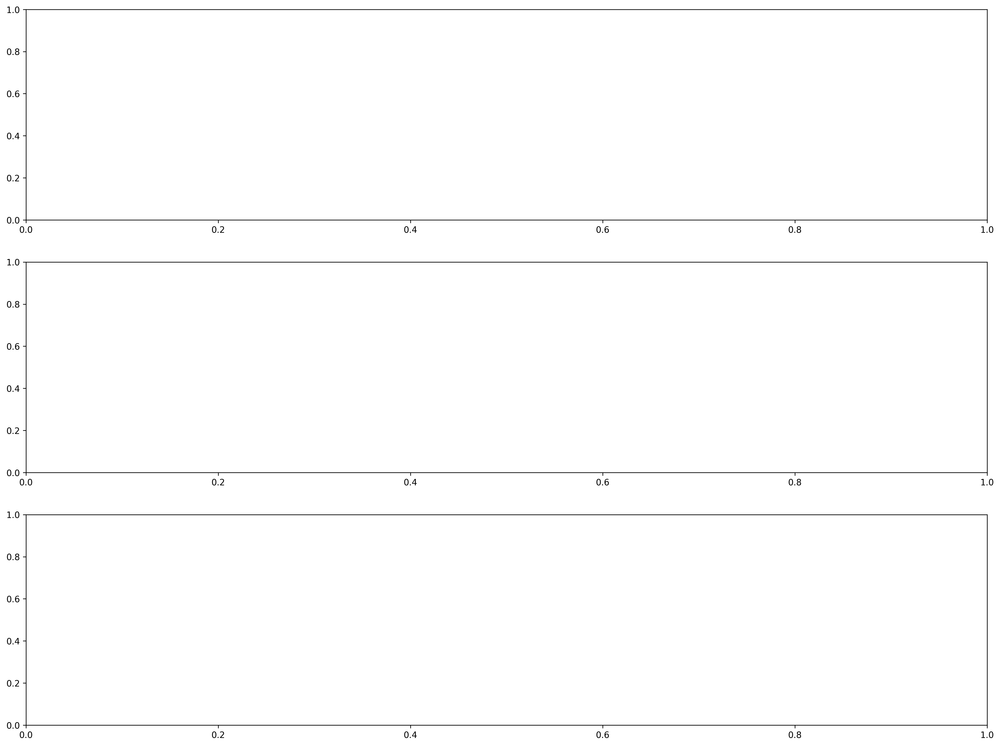

In [12]:
gait_analyzer.plot_left_right_comparison(result_dir=analyze_result_dir)

## compare with reference data

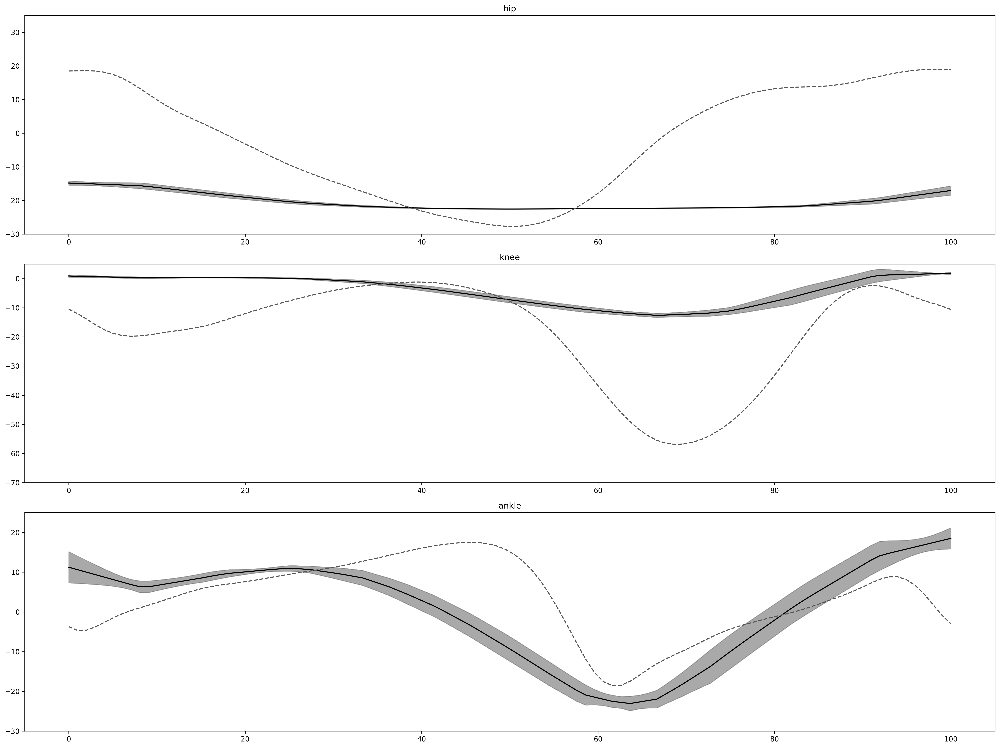

In [13]:
## compare with reference data
gait_analyzer.plot_right_ref_comparison(result_dir=analyze_result_dir)


# Contact data

In [14]:
# Contact data
print(len(gait_data.series_data["physics_data"]["contacts"]["data"]))
contact_data_num = 0
contact_object_name_set = set()
for contact_data_list in gait_data.series_data["physics_data"]["contacts"]["data"]:
    contact_data_num += len(contact_data_list)
    for contact_data in contact_data_list:
        contact_object_name_set.add(contact_data["geom1"])
        contact_object_name_set.add(contact_data["geom2"])

print(f"average contact data per frame: {contact_data_num/len(gait_data.series_data['physics_data']['contacts']['data'])}")
print(contact_object_name_set)


600
average contact data per frame: 1.6016666666666666
{'calcn_l_geom_1', 'ground-plane', 'calcn_r_geom_1'}


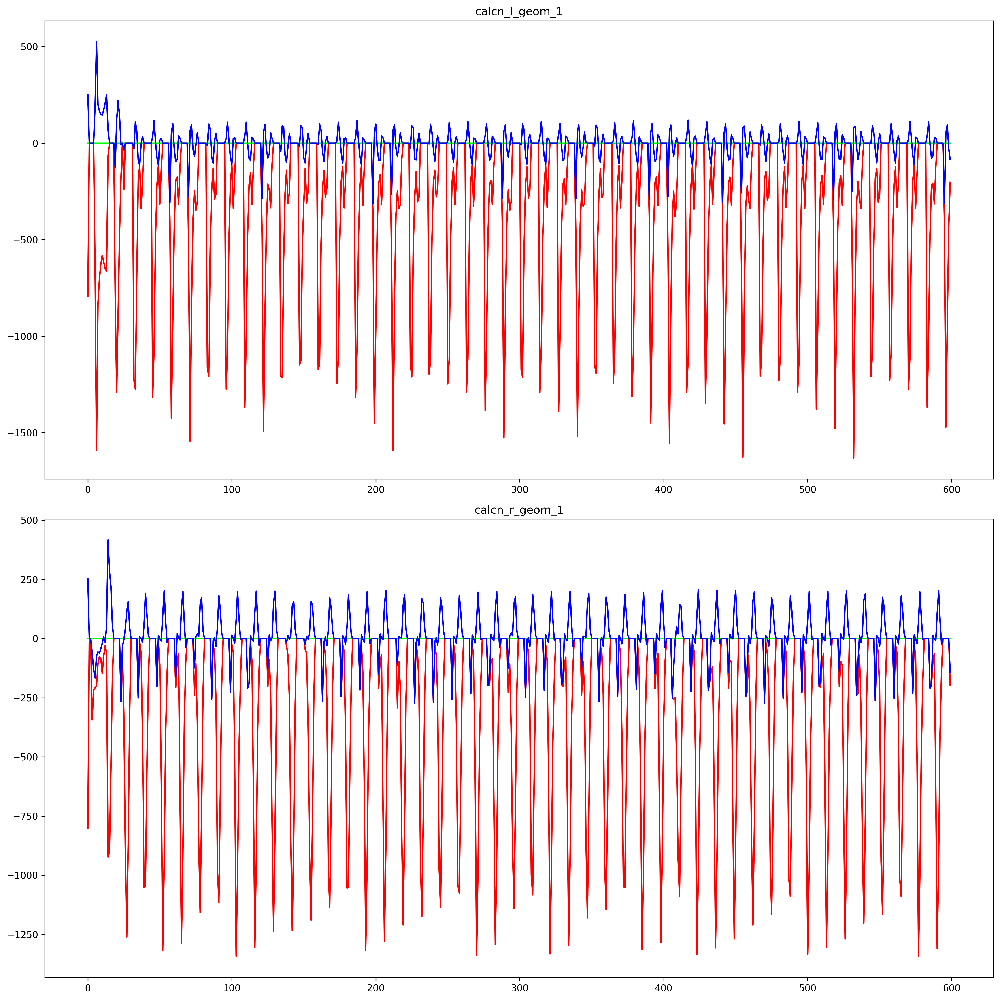

In [15]:
gait_analyzer.plot_contact_data(result_dir=analyze_result_dir)

# Test gait_evaluate.py - GaitEvaluater replay


In [16]:
gait_evaluator.replay(gait_data_path, os.path.join(analyze_result_dir, "replay.mp4"))

d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\skvideo\io\ffmpeg.py:466: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  self._proc.stdin.write(vid.tostring())
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\skvideo\io\ffmpeg.py:466: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  self._proc.stdin.write(vid.tostring())
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\skvideo\io\ffmpeg.py:466: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  self._proc.stdin.write(vid.tostring())
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\skvideo\io\ffmpeg.py:466: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  self._proc.stdin.write(vid.tostring())
d:\northeastern\neu_dev\myosuite_project\.venv\lib\site-packages\skvideo\io\ffmpeg.py:466: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  self._proc.stdin.write(vid.tostrin